# Проект "Рынок заведений общественного питания Москвы".

**Описание проекта:**<br>Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят нас подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цель исследования:** <br>
1. Исследовать рынок Москвы.<br>
2. Найти интересные особенности.<br>
3. Презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.<br>

**Этапы исследования:** <br>
1. Загрузка данных и изучение общей информации, <br>
2. Предобработка данных, <br>
3. Анализ данных, <br>
4. Детализация исследования, <br>
5. Подготовка презентации.<br>


## Откроем файл с данными и изучим общую информацию:

In [1]:
import pandas as pd # подгружаем библиотеки
import os
import matplotlib.pyplot as plt
import warnings
import plotly.express as px
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
#register_matplotlib_converters()
from plotly import graph_objects as go 
import plotly.express as px
import seaborn as sns
import json
from folium import Map, Choropleth
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [2]:
pth1 = 'C:/Users/volsi/Documents/Обучение Яндекс/Проекты/Общепит в Москве/moscow_places.csv'
pth2 = '/datasets/moscow_places.csv'

if os.path.exists(pth1):
    data = pd.read_csv (pth1, sep= ',' )
elif os.path.exists(pth2):
    data = pd.read_csv(pth2,  sep= ',')
else:
    print('Something is wrong')
display (data)    

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


**Получили таблицу с данными о заведениях общепита Москвы размером 8406 х 14.** 

## Подготовим данные:

**Выведем общую информацию о датасете:**

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**В данных много пропусков, но удалять пока не будем, так как это может исказить результат.**

**Посчитаем дубликаты:**

In [4]:
data.duplicated().sum()

0

**Создадим столбец street с названиями улиц из столбца с адресом:**

In [5]:
def spl(field):
    return field.split(', ')[1]

data['street'] = data['address'].apply(spl)
data['street'].head(10)

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
5             Ижорская улица
6         Клязьминская улица
7         Клязьминская улица
8          Дмитровское шоссе
9            Ангарская улица
Name: street, dtype: object

**Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):**

In [6]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'
data['is_24/7'].sum()

730

**Проверим другим способом:**

In [7]:
def is24(field):
    if 'ежедневно' in str(field):
        if 'круглосуточно' in field:
            return True
    else:
        return False

data['hours'].apply(is24).sum()

730

**Результат тот же**

**Приведем названия заведений к нижнему регистру:**

In [8]:
data['name'] = data['name'].str.lower().map(str.strip)

**Поищем дубликаты в столбцах 'name' и 'address':**

In [9]:
data[data.duplicated(subset=['name', 'address'])]


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,проспект Мира,False
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,Ярцевская улица,False


**Удалим 3 найденных дубликата:**

In [10]:
data.drop (index=data[data.duplicated(subset=['name', 'address'])].index
, axis= 0 , inplace= True )

**Проверим результат:**

In [11]:
data[data.duplicated(subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7


## Анализ данных:

**Выясним, какие категории заведений представлены в данных, исследуем количество объектов общественного питания по категориям:**

In [12]:
data['category'].value_counts()

кафе               2377
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

**Построим диаграмму распределения объектов общественного питания по категориям:**

In [13]:
fig = px.bar(x=data.groupby('category')['name'].count().sort_values(ascending = False).index, y=data.groupby('category')['name'].count().sort_values(ascending = False))
fig.update_layout(
title = 'Распределение объектов общественного питания по категориям',
xaxis_title ="Категория",
yaxis_title="Число заведений")
fig.show() 

**Наибольшая доля заведений общественного питания входит в категорию "кафе", чуть меньше - в категорию "ресторан", на 2 эти категории проиходится больше половины всех заведений общепита Москвы.**

**Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы:**

In [14]:
data.groupby('category')['seats'].sum().sort_values(ascending = False)

category
ресторан           154681.0
кафе               118494.0
кофейня             83511.0
бар,паб             58131.0
пиццерия            40350.0
быстрое питание     34513.0
столовая            16359.0
булочная            13229.0
Name: seats, dtype: float64

In [15]:
fig = px.bar(x=data.groupby('category')['seats'].sum().sort_values(ascending = False).index, y=data.groupby('category')['seats'].sum().sort_values(ascending = False))
fig.update_layout(
title = 'Распределение количества посадочных мест по категориям заведений',
xaxis_title ="Категория",
yaxis_title="Количество посадочных мест")
fig.show() 

**Наибольшее число посадочных мест содержит в себе категория "ресторан".**

**Само по себе количество посадочных мест по категориям мало, о чем говорит, так как зависит от количества заведений,поэтому посчитаем медианное количество посадочных мест в каждой категории и построим диаграмму:** 

In [16]:
data.groupby('category')['seats'].median().sort_values(ascending = False)

category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

In [17]:
fig = px.bar(x=data.groupby('category')['seats'].median().sort_values(ascending = False).index, y=data.groupby('category')['seats'].median().sort_values(ascending = False))
fig.update_layout(
title = 'Распределение медианного числа посадочных мест по категориям заведений',
xaxis_title ="Категория",
yaxis_title="Медианное число посадочных мест")
fig.show() 

**Теперь распределение намного более равномерное. В лидерах по медианному количеству посадочных мест рестораны, на втором месте бары и пабы.**

**Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Выясним, каких заведений больше:**

In [18]:
names = ['Сетевые', 'Несетевые']
values = [data['chain'].mean(),1-data['chain'].mean()]
layout = go.Layout(
    title='Cоотношение сетевых и несетевых заведений '
)
fig = go.Figure(data=[go.Pie(labels=names, values=values)],layout=layout)
fig.show() 

**Несетевых заведений больше. Доля сетевых заведений в датасете составляет 38,1%, несетевых заведений - 61,9%**

**Выясним, какие категории заведений чаще являются сетевыми. Исследуем данные и ответим на вопрос графиком:**

In [19]:
chain_part = data.groupby('category')['chain'].mean().sort_values(ascending = False)
chain_part

category
булочная           0.613281
пиццерия           0.521327
кофейня            0.509554
быстрое питание    0.384743
ресторан           0.357003
кафе               0.327724
столовая           0.279365
бар,паб            0.219895
Name: chain, dtype: float64

In [20]:
fig = px.bar(x=chain_part.index, y=chain_part*100)
fig.update_layout(
title = 'Доля сетевых заведений по категориям',
xaxis_title ="Категория",
yaxis_title="Доля, %")
fig.show() 


**Сетевыми чаще всего бывают булочные, пиццерии и кофейни.** 

**Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим визуализацию:**

In [21]:
top_15 = data[data['chain']==1].groupby('name')['category'].count().sort_values( ascending=False).head(15)
top_15

name
шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: category, dtype: int64

In [22]:
fig = px.bar(x=top_15.index, y=top_15)
fig.update_layout(
title = 'Топ-15 популярных сетей в Москве',
xaxis_title ="Название",
yaxis_title="Количество заведений")
fig.show() 


**У Шоколадницы больше всего заведений. Многие сети на слуху.**

**Посмотрим, что объединяет эти топ-15 сетей:**

In [23]:
data[data['name'].isin(top_15.index)].groupby('name').nunique() #выводим количество уникальных значений по каждому полю

,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
name,,,,,,,,,,,,,,,
cofefest,2,32,9,8,32,32,11,1,6,2,4,1,9,32,1
cofix,1,65,9,31,65,65,11,2,5,0,4,1,29,58,2
one price coffee,1,72,9,28,72,72,17,1,2,0,2,2,43,60,2
prime,2,50,8,25,50,50,9,2,11,8,0,1,29,46,1
буханка,3,32,7,4,32,32,10,2,4,4,0,1,8,32,1
додо пицца,1,74,9,21,74,74,8,1,59,59,0,1,42,72,1
домино'с пицца,1,77,9,26,77,77,5,2,7,7,0,2,37,75,1
кофепорт,1,42,8,12,42,42,8,1,2,0,2,1,18,37,1
кулинарная лавка братьев караваевых,1,39,6,1,39,39,4,2,21,16,0,1,18,38,1


**Сети полностью совпадают только по столбцу chain, но это следовало из условия задачи.**

**Посмотрим, к каким категориям относятся найденные сети:**

In [24]:
data[data['name'].isin(top_15.index)].groupby('category')['name'].nunique().sort_values(ascending = False) #выводим количество уникальных значений по каждому полю

category
кафе               8
кофейня            7
ресторан           6
быстрое питание    4
пиццерия           3
бар,паб            2
столовая           2
булочная           1
Name: name, dtype: int64

**8 из 15 заведений относятся к категории "кафе". Сумма не равна 15, так как одно и тоже название может встречаться в датасете в нескольких категориях.**

**Выясним, какие административные районы Москвы присутствуют в датасете:**

In [25]:
print(data['district'].unique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [26]:
print('Всего заведений в датасете', data['name'].count())

Всего заведений в датасете 8403


**Посмотрим распределение заведений разных категорий по районам:**

In [27]:
regions_table = data.pivot_table(index = 'district', values = 'name', columns ='category', aggfunc= 'count')
regions_table

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,235,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [28]:
fig = px.bar(regions_table.reset_index(), x='district', y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'], title=' Количество заведений каждой категории по районам').update_xaxes(categoryorder = 'total descending')
fig.update_layout(
xaxis_title ="Название района",
yaxis_title="Количество заведений")
fig.show() 

**Больше всего заведений находится в Центральном административном округе.**

**Визуализируем распределение средних рейтингов по категориям заведений:**

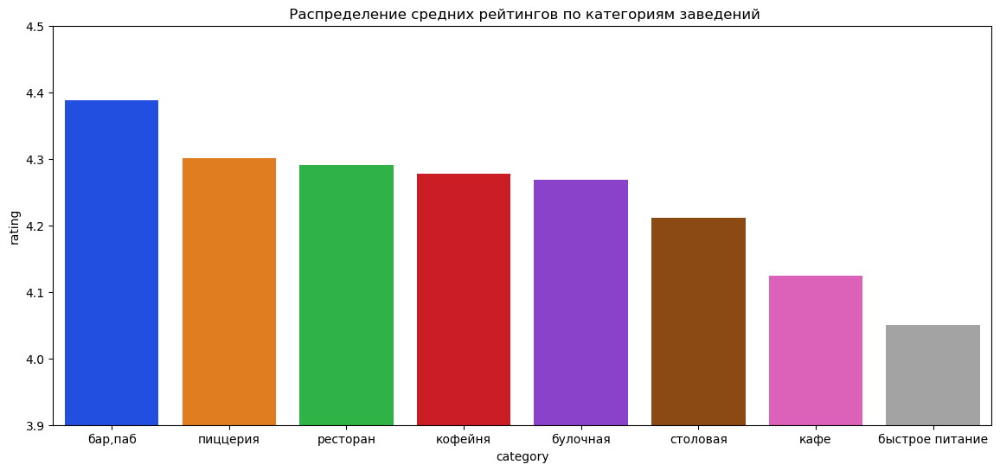

In [29]:
sns.set_palette('bright') 
plt.figure(figsize=(14, 6))
ax=sns.barplot(x='category', y='rating', data=data.groupby('category')['rating'].mean().reset_index().sort_values(by = 'rating', ascending = False) ) 
ax.set_ylim(3.9,4.5)
ax.set_title (' Распределение средних рейтингов по категориям заведений' );

**Усреднённые рейтинги в разных типах общепита отличаются слабо. Наивысший средний рейтинг у заведений категории "бар, паб".**

**Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района:**

In [30]:
data.groupby('district').rating.mean().sort_values(ascending = False)

district
Центральный административный округ         4.377520
Северный административный округ            4.239822
Северо-Западный административный округ     4.208802
Южный административный округ               4.184417
Западный административный округ            4.181647
Восточный административный округ           4.174185
Юго-Западный административный округ        4.172920
Северо-Восточный административный округ    4.147978
Юго-Восточный административный округ       4.101120
Name: rating, dtype: float64

In [31]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:/Users/volsi/Documents/Обучение Яндекс/Проекты/Общепит в Москве/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').rating.mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
    
).add_to(m)

# выводим карту
m

**Наивысший средний рейтинг в центральном административном регионе.**

**Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium:**

In [32]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Найдём топ-15 улиц по количеству заведений:**

In [33]:
streets_table = data.pivot_table(index = 'street', values = 'name', columns ='category', aggfunc= 'count', margins = True).reset_index().sort_values(by = 'All', ascending = False).head(16)
streets_table



category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
1448,All,764.0,256.0,603.0,2377.0,1413.0,633.0,2042.0,315.0,8403
1090,проспект Мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183
773,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
1087,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108
525,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107
523,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95
373,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88
455,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
298,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76
524,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70


**Построим график распределения количества заведений и их категорий по этим улицам:**

In [34]:
streets_table.drop (index=streets_table.index [0], axis= 0 , inplace= True )
fig = px.bar(streets_table, x='street', y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'], title=' Топ-15 улиц по количеству заведений')
fig.update_layout(
xaxis_title ="Улица",
yaxis_title="Количество заведений")
fig.show() 

**Больше всего заведений сосредоточено на проспекте Мира.**

**Найдём улицы, на которых находится только один объект общепита:**

In [35]:
streets_1 = data.groupby('street').count().query('name == 1').index
print (streets_1)

Index(['1-й Автозаводский проезд', '1-й Балтийский переулок',
       '1-й Варшавский проезд', '1-й Вешняковский проезд',
       '1-й Голутвинский переулок', '1-й Грайвороновский проезд',
       '1-й Дербеневский переулок', '1-й Земельный переулок',
       '1-й Капотнинский проезд', '1-й Кирпичный переулок',
       ...
       'улица Уткина', 'улица Фадеева', 'улица Фотиевой', 'улица Чечулина',
       'улица Чистова', 'улица Шкулёва', 'улица Шкулёва 4', 'улица Шухова',
       'улица Юннатов', '№ 7'],
      dtype='object', name='street', length=458)


**Посмотрим, что объединяет эти заведения, выведем первые 30 строк датасета с найденными улицами:**

In [36]:
data[data['street'].isin(streets_1)].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
64,testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,Лианозовский парк культуры и отдыха,False
71,cofefest,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN,Новгородская улица,False
73,веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,парк Алтуфьево,False
97,жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Бибиревская улица,False
103,тетри,быстрое питание,"Москва, Лианозовский проезд, вл1",Северо-Восточный административный округ,вт-вс 09:00–19:00,55.896922,37.554929,4.0,средние,Средний счёт:150–250 ₽,200.0,NaN,0,NaN,Лианозовский проезд,False


**На первый взгляд какого-то одного общего признака у этих заведений нет.**

**Посчитаем медиану столбца 'middle_avg_bill' для каждого района:**

In [37]:
data.groupby('district')['middle_avg_bill'].median()

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

**Построим фоновую картограмму (хороплет) по медианным значениям средних чеков для каждого района:**

In [38]:

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').median().reset_index(),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

**Из картограммы видно что самые высокие медианные средние чеки в Центральном и Западном административных округах. По мере удаления от центра медианные значения средних чеков снижаются, исключение составляет только Западный административный округ.**

**Исследуем часы работы заведений и их зависимость от расположения и категории заведения:** 

In [39]:
data.groupby('district')['is_24/7'].mean()

district
Восточный административный округ           0.121554
Западный административный округ            0.084706
Северный административный округ            0.078977
Северо-Восточный административный округ    0.084270
Северо-Западный административный округ     0.105134
Центральный административный округ         0.058430
Юго-Восточный административный округ       0.130252
Юго-Западный административный округ        0.102962
Южный административный округ               0.084081
Name: is_24/7, dtype: float64

In [40]:

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').mean().reset_index(),
    columns=['district', 'is_24/7'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Доля круглосуточных заведений по районам',
).add_to(m)

# выводим карту
m

**Из картограммы следует, что наименьшая доля заведений с графиком работы 24/7, находится в Центральном адмнистративном округе, наибольшая - в Юго-Восточном и Восточном административных округах.**

**Общий вывод:**
1.	Датасет состоит из 8406 строк. Каждая строка – отдельное заведение общепита Москвы;
2.	В данных много пропусков, но удалять пока не будем, так как это может исказить результат;
3.	Явные дубликаты в данных отсутствуют, неявных найдено и удалено 3 штуки;
4.	Для удобства анализа были созданы столбцы  street с названиями улиц и is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7);
5. В данных представлены заведения следующих категорий: кафе,ресторан,кофейня,            
   «бар,паб»,пиццерия, быстрое питание, столовая, булочная.   
6.	Наибольшая доля заведений общественного питания входит в категорию "кафе", чуть меньше - в категорию "ресторан", на 2 эти категории проиходится больше половины всех заведений общепита Москвы;
7.	Наибольшее число посадочных мест содержит в себе категория "ресторан";
8.	В лидерах по медианному количеству посадочных мест также рестораны, на втором месте бары и пабы;
9.	Несетевых заведений больше. Доля сетевых заведений в датасете составляет 38,1%, несетевых заведений - 61,9%;
10.	Сетевыми чаще всего бывают булочные, пиццерии и кофейни;
11.	Топ-15 популярных сетей в Москве: <br>
    Шоколадница                            120 <br>
    Домино'с Пицца                          76<br>
    Додо Пицца                              74<br>
    One Price Coffee                        71<br>
    Яндекс Лавка                            69<br>
    Cofix                                   65<br>
    Prime                                   50<br>
    Хинкальная                              44<br>
    КОФЕПОРТ                                42<br>
    Кулинарная лавка братьев Караваевых     39<br>
    Теремок                                 38<br>
    Чайхана                                 37<br>
    CofeFest                                32<br>
    Буханка                                 32<br>
    Му-Му                                   27;<br>
12.	Самая популярная сеть – Шоколадница;
13.	Сети полностью совпадают только по столбцу chain, но это следовало из условия;
14.	Топ 15 сетей соответствуют следующим категориям:<br>
    кафе               8<br>
    кофейня            7<br>
    ресторан           6<br>
    быстрое питание    4<br>
    пиццерия           3<br>
    бар,паб            2<br>
    столовая           2<br>
    булочная           1;<br>
15.	8 из 15 заведений относятся к категории "кафе". Одно и то же название может встречаться в датасете в нескольких категориях;
16.	Больше всего заведений находится в Центральном административном округе;
17.	Усреднённые рейтинги в разных типах общепита отличаются слабо. Наивысший средний рейтинг у заведений категории "бар, паб";.
18.	Наивысший средний рейтинг в центральном административном регионе;
19.	Топ-15 улиц по количеству заведений:<br>
       проспект Мира<br>
       Профсоюзная улица<br>
       проспект Вернадского<br>
       Ленинский проспект<br>
       Ленинградский проспект<br>
       Дмитровское шоссе<br>
       Каширское шоссе<br>
       Варшавское шоссе<br>
       Ленинградское шоссе<br>
       МКАД<br>
       Люблинская улица<br>
       улица Вавилова<br>
       Кутузовский проспект<br>
       улица Миклухо-Маклая<br>
       Пятницкая улица;<br>
19.	Больше всего заведений сосредоточено на проспекте Мира;
20.	Улиц, на которых находится только один объект общепита в датасете 458.На первый взгляд какого-то одного общего признака у этих заведений нет;
21.	Самые высокие медианные средние чеки в Центральном и Западном административных округах. По мере удаления от центра медианные значения средних чеков снижаются, исключение составляет только Западный административный округ;
22.	Наименьшая доля заведений с графиком работы 24/7, находится в Центральном адмнистративном округе, наибольшая - в Юго-Восточном и Восточном административных округах.

## Детализация

**Посчитаем количество кофеен в датасете:**

In [41]:
len(data.query('category == "кофейня"'))

1413

**Выясним, в каких районах кофеен больше всего, каковы особенности их расположения:**

In [42]:
data.query('category == "кофейня"').groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: name, dtype: int64

In [43]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=data.query('category == "кофейня"').groupby('district').count().reset_index(),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Количество кофеен по по районам',
).add_to(m)

# выводим карту
m

**Больше всего кофеен в центральном административном округе**

**Посчитаем долю кофеен от общего числа заведений по районам:**

In [44]:
data['is_coffee']=data['category'] == 'кофейня'

In [45]:
data.groupby('district')['is_coffee'].mean().sort_values(ascending=False)

district
Северный административный округ            0.214683
Центральный административный округ         0.190901
Северо-Восточный административный округ    0.178652
Западный административный округ            0.176471
Северо-Западный административный округ     0.151589
Южный административный округ               0.146861
Юго-Западный административный округ        0.135402
Восточный административный округ           0.131579
Юго-Восточный административный округ       0.124650
Name: is_coffee, dtype: float64

In [46]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').mean().reset_index(),
    columns=['district', 'is_coffee'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Относительная доля кофеен по по районам',
).add_to(m)

# выводим карту
m

**Самая высокая доля кофеен в Северном административном округе.**

**Посмотрим, есть ли круглосуточные кофейни:**

In [47]:
data[data['is_coffee']& data['is_24/7']]['name'].count()

59

**Таких всего 59 штук**

**Оценим, какие у кофеен рейтинги, и как они распределяются по районам:**

In [48]:
data[data['is_coffee']].groupby('district')['rating'].mean().sort_values(ascending = False)

district
Центральный административный округ         4.336449
Северо-Западный административный округ     4.325806
Северный административный округ            4.291710
Юго-Западный административный округ        4.283333
Восточный административный округ           4.282857
Южный административный округ               4.232824
Юго-Восточный административный округ       4.225843
Северо-Восточный административный округ    4.216981
Западный административный округ            4.195333
Name: rating, dtype: float64

In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=data[data['is_coffee']].groupby('district').mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по по районам',
).add_to(m)

# выводим карту
m

**Средние рейтинги по районам отличаются в целом незначительно. Максимальный средний рейтинг у кофеен в Центральном и Северо-Западном административных округах.**

**Посмотрим, на какую стоимость чашки капучино стоит ориентироваться при открытии и почему:**

In [50]:
round(data[data['is_coffee']].groupby('district')['middle_coffee_cup'].mean().sort_values(ascending = False))

district
Западный административный округ            190.0
Центральный административный округ         188.0
Юго-Западный административный округ        184.0
Восточный административный округ           174.0
Северный административный округ            166.0
Северо-Западный административный округ     166.0
Северо-Восточный административный округ    165.0
Южный административный округ               158.0
Юго-Восточный административный округ       151.0
Name: middle_coffee_cup, dtype: float64

**Стоимость чашки капучино, на которую стоит ориентироваться, составляет от 151 до 190 рублей, стоимость зависит от района.**

**Средняя стоимость чашки кофе в Москве составляет:**

In [51]:
round(data['middle_coffee_cup'].mean())

175

## Выводы и рекомендации: 
   **Распределения по категориям, рейтингам и районам недостаточно для того, чтобы давать рекомендации по поводу открытия заведения общепита, так как для этого необходимо рассчитать экономическую целесообразность, учесть посещаемость, конверсию, выручку и т.д..<br>
    Я бы рекомендовал провести дополнительное исследование, так как, например, большое количество заведений в центре может с одной стороны говорить о том, что там есть спрос, и они окупаются, а с другой, что там высокая конкуренция и занятая ниша.**

## Презентация: <br>
**https://disk.yandex.ru/i/R18ubAX2xfBPZA**